# IC3392 GAS kinematics across five runs: 8900-A grid test

This notebook is GAS-only. It tests whether the unusual gas kinematic behaviour changes when the standard v7.6.8 setup is fit over `4800-8900 A` instead of `4800-9100 A`, while keeping `VELSCALE = 41`.

Primary comparison:

`grid_range_test = v768_8900 - v768_full_9100`

If the log-rebin/grid hypothesis is important, the 8900 run should differ from the original 9100 run even though the setup is otherwise the same standard full-red-line GAS setup.

Gas kinematic lines checked here:

- `HB4861`
- `HA6562`
- `NII6583`
- `SII6716`

For each line, both `VEL` and `SIGMA` maps are compared across five runs.


In [1]:
from pathlib import Path
from datetime import datetime

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import TwoSlopeNorm

plt.style.use('seaborn-v0_8-whitegrid')
pd.set_option('display.max_columns', 140)
pd.set_option('display.max_colwidth', 180)

root = Path('.')
GALAXY = 'IC3392'
DIFF_LIMIT = 20.0  # km/s cap for focused gas velocity/sigma residual maps

RUNS = {
    'old_v721_7000': {
        'label': 'v3_v7.2.1 old CONFIG to 7000',
        'plot_label': '7.2.1 old cfg 7000',
        'gas_path': root / 'v3_v7.2.1' / GALAXY / f'{GALAXY}_gas_BIN_maps.fits',
        'config_path': root / 'v3_v7.2.1' / GALAXY / 'CONFIG',
    },
    'v768_7000': {
        'label': 'v3tk_v7.6.8_7000 old-style CONFIG to 7000',
        'plot_label': '7.6.8 old cfg 7000',
        'gas_path': root / 'v3tk_v7.6.8_7000' / GALAXY / f'{GALAXY}_gas_bin_maps.fits',
        'config_path': root / 'v3tk_v7.6.8_7000' / GALAXY / 'CONFIG',
    },
    'v768_uptoSII': {
        'label': 'v3tk_v7.6.8 standard setup with GAS lines up to SII',
        'plot_label': '7.6.8 uptoSII 9100',
        'gas_path': root / 'v3tk_v7.6.8_uptoSII' / GALAXY / f'{GALAXY}_gas_bin_maps.fits',
        'config_path': root / 'v3tk_v7.6.8_uptoSII' / GALAXY / 'CONFIG',
    },
    'v768_8900': {
        'label': 'v3tk_v7.6.8 standard full GAS setup to 8900',
        'plot_label': '7.6.8 full 8900',
        'gas_path': root / 'v3tk_v7.6.8_8900' / GALAXY / f'{GALAXY}_gas_bin_maps.fits',
        'config_path': root / 'v3tk_v7.6.8_8900' / GALAXY / 'CONFIG',
    },
    'v768_full_9100': {
        'label': 'v3tk_v7.6.8 original standard full GAS setup to 9100',
        'plot_label': '7.6.8 full 9100',
        'gas_path': root / 'v3tk_v7.6.8' / GALAXY / f'{GALAXY}_gas_bin_maps.fits',
        'config_path': root / 'v3tk_v7.6.8' / GALAXY / 'CONFIG',
    },
}
RUN_ORDER = ['old_v721_7000', 'v768_7000', 'v768_uptoSII', 'v768_8900', 'v768_full_9100']

PAIR_COMPARISONS = [
    {
        'pair_key': 'grid_range_test',
        'baseline': 'v768_full_9100',
        'compare': 'v768_8900',
        'label': '8900-A run minus original 9100-A run; direct log-rebin/grid test',
    },
    {
        'pair_key': 'full9100_red_lines_effect',
        'baseline': 'v768_uptoSII',
        'compare': 'v768_full_9100',
        'label': 'original full red-line file minus uptoSII line file, both to 9100',
    },
    {
        'pair_key': 'full8900_vs_uptoSII',
        'baseline': 'v768_uptoSII',
        'compare': 'v768_8900',
        'label': '8900 full red-line run minus uptoSII 9100 run',
    },
    {
        'pair_key': 'full8900_vs_7000',
        'baseline': 'v768_7000',
        'compare': 'v768_8900',
        'label': '8900 standard full setup minus 7000 old-style setup',
    },
    {
        'pair_key': 'full9100_vs_7000',
        'baseline': 'v768_7000',
        'compare': 'v768_full_9100',
        'label': '9100 standard full setup minus 7000 old-style setup',
    },
    {
        'pair_key': 'version_proxy',
        'baseline': 'old_v721_7000',
        'compare': 'v768_7000',
        'label': 'v7.6.8_7000 minus old v7.2.1; approximate nGIST-version effect',
    },
]
PAIR_BY_KEY = {pair['pair_key']: pair for pair in PAIR_COMPARISONS}
MAP_PAIR_KEYS = ['grid_range_test', 'full9100_red_lines_effect', 'full8900_vs_uptoSII', 'full8900_vs_7000']

GAS_LINES = ['HB4861', 'HA6562', 'NII6583', 'SII6716']
GAS_SUFFIXES = ['VEL', 'SIGMA']
GAS_EXTENSIONS = [f'{line}_{suffix}' for line in GAS_LINES for suffix in GAS_SUFFIXES]
TRACERS = {
    f'GAS_{line}_{suffix}': {
        'extname': f'{line}_{suffix}',
        'line': line,
        'suffix': suffix,
        'label': f'GAS {line}_{suffix}',
        'cmap': 'RdBu_r' if suffix == 'VEL' else 'magma',
        'center_main': suffix == 'VEL',
        'unit': 'km/s',
    }
    for line in GAS_LINES
    for suffix in GAS_SUFFIXES
}
TRACER_ORDER = [f'GAS_{line}_{suffix}' for line in GAS_LINES for suffix in GAS_SUFFIXES]


def describe_path(path):
    if not path.exists():
        return {'exists': False, 'size_mb': np.nan, 'modified': ''}
    return {
        'exists': True,
        'size_mb': path.stat().st_size / 1024**2,
        'modified': datetime.fromtimestamp(path.stat().st_mtime).strftime('%Y-%m-%d %H:%M:%S'),
    }


file_rows = []
for run_key in RUN_ORDER:
    info = RUNS[run_key]
    for kind in ['gas_path', 'config_path']:
        status = describe_path(info[kind])
        if not status['exists']:
            raise FileNotFoundError(f'Missing {run_key} {kind}: {info[kind]}')
    file_rows.append(
        {
            'run_key': run_key,
            'label': info['label'],
            'gas_path': str(info['gas_path']),
            'gas_size_mb': describe_path(info['gas_path'])['size_mb'],
            'config_path': str(info['config_path']),
            'gas_modified': describe_path(info['gas_path'])['modified'],
        }
    )

print('All required GAS and CONFIG files found.')
display(pd.DataFrame(file_rows))


All required GAS and CONFIG files found.


,run_key,label,gas_path,gas_size_mb,config_path,gas_modified
0,old_v721_7000,v3_v7.2.1 old CONFIG to 7000,v3_v7.2.1/IC3392/IC3392_gas_BIN_maps.fits,152.251282,v3_v7.2.1/IC3392/CONFIG,2026-03-15 13:58:31
1,v768_7000,v3tk_v7.6.8_7000 old-style CONFIG to 7000,v3tk_v7.6.8_7000/IC3392/IC3392_gas_bin_maps.fits,152.251282,v3tk_v7.6.8_7000/IC3392/CONFIG,2026-05-04 15:20:20
2,v768_uptoSII,v3tk_v7.6.8 standard setup with GAS lines up to SII,v3tk_v7.6.8_uptoSII/IC3392/IC3392_gas_bin_maps.fits,152.251282,v3tk_v7.6.8_uptoSII/IC3392/CONFIG,2026-05-04 20:08:32
3,v768_8900,v3tk_v7.6.8 standard full GAS setup to 8900,v3tk_v7.6.8_8900/IC3392/IC3392_gas_bin_maps.fits,213.736267,v3tk_v7.6.8_8900/IC3392/CONFIG,2026-05-05 21:42:55
4,v768_full_9100,v3tk_v7.6.8 original standard full GAS setup to 9100,v3tk_v7.6.8/IC3392/IC3392_gas_bin_maps.fits,223.983765,v3tk_v7.6.8/IC3392/CONFIG,2026-03-21 13:49:31


## CONFIG context

The focused `grid_range_test` should show only the wavelength-end changes between the 8900-A and 9100-A standard full-red-line runs. `PREPARE_SPECTRA.VELSCALE` is included explicitly because the point of the test is to see whether the wavelength range/grid changes the GAS kinematics while keeping `VELSCALE = 41`.

In [2]:
def parse_simple_config(path):
    config = {}
    section = None
    with open(path) as fh:
        for raw_line in fh:
            line = raw_line.rstrip()
            if not line or line.lstrip().startswith('#'):
                continue
            if not line.startswith(' ') and line.endswith(':'):
                section = line[:-1]
                config[section] = {}
                continue
            if section is not None and ':' in line:
                key, value = line.strip().split(':', 1)
                config[section][key.strip()] = value.strip()
    return config


CONFIG_FIELDS = [
    ('READ_DATA', 'LMIN_TOT'),
    ('READ_DATA', 'LMAX_TOT'),
    ('READ_DATA', 'LMIN_SNR'),
    ('READ_DATA', 'LMAX_SNR'),
    ('PREPARE_SPECTRA', 'VELSCALE'),
    ('KIN', 'LMIN'),
    ('KIN', 'LMAX'),
    ('KIN', 'SPEC_MASK'),
    ('KIN', 'LIBRARY'),
    ('CONT', 'LMIN'),
    ('CONT', 'LMAX'),
    ('CONT', 'MDEG'),
    ('CONT', 'LIBRARY'),
    ('GAS', 'LMIN'),
    ('GAS', 'LMAX'),
    ('GAS', 'LEVEL'),
    ('GAS', 'MDEG'),
    ('GAS', 'EMI_FILE'),
    ('GAS', 'LIBRARY'),
    ('SFH', 'LMIN'),
    ('SFH', 'LMAX'),
]

config_rows = []
for run_key in RUN_ORDER:
    config = parse_simple_config(RUNS[run_key]['config_path'])
    row = {'run_key': run_key, 'label': RUNS[run_key]['label']}
    for section, key in CONFIG_FIELDS:
        row[f'{section}.{key}'] = config.get(section, {}).get(key, '')
    config_rows.append(row)

config_summary = pd.DataFrame(config_rows)
display(config_summary)

pair_config_delta_rows = []
for pair in PAIR_COMPARISONS:
    base = config_summary.loc[config_summary['run_key'] == pair['baseline']].iloc[0]
    comp = config_summary.loc[config_summary['run_key'] == pair['compare']].iloc[0]
    for column in config_summary.columns:
        if column in {'run_key', 'label'}:
            continue
        if str(base[column]) != str(comp[column]):
            pair_config_delta_rows.append(
                {
                    'pair_key': pair['pair_key'],
                    'pair_label': pair['label'],
                    'field': column,
                    'baseline': base[column],
                    'compare': comp[column],
                }
            )

config_deltas = pd.DataFrame(pair_config_delta_rows)
print('Focused CONFIG delta: v768_8900 - v768_full_9100')
display(config_deltas[config_deltas['pair_key'] == 'grid_range_test'])
print('All selected CONFIG deltas')
display(config_deltas)


,run_key,label,READ_DATA.LMIN_TOT,READ_DATA.LMAX_TOT,READ_DATA.LMIN_SNR,READ_DATA.LMAX_SNR,PREPARE_SPECTRA.VELSCALE,KIN.LMIN,KIN.LMAX,KIN.SPEC_MASK,KIN.LIBRARY,CONT.LMIN,CONT.LMAX,CONT.MDEG,CONT.LIBRARY,GAS.LMIN,GAS.LMAX,GAS.LEVEL,GAS.MDEG,GAS.EMI_FILE,GAS.LIBRARY,SFH.LMIN,SFH.LMAX
0,old_v721_7000,v3_v7.2.1 old CONFIG to 7000,4800,7000,4800,7000,53,4800,7000,specMask_KIN,MILES_EMLINES/,4800,7000,8,MILES_EMLINES/,4800,7000,BIN,8,emissionLinesPHANGS.config,MILES_EMLINES/,4800,7000
1,v768_7000,v3tk_v7.6.8_7000 old-style CONFIG to 7000,4800,7000,4800,7000,53,4800,7000,specMask_KIN,MILES_EMLINES/,4800,7000,8,MILES_EMLINES/,4800,7000,BIN,8,emissionLines_ppxf.config,MILES_EMLINES/,4800,7000
2,v768_uptoSII,v3tk_v7.6.8 standard setup with GAS lines up to SII,4800,9100,4800,9100,41,4800,9100,specMask_KIN_narrow10,EMILES_baseFe_EMLINES/,4800,9100,23,EMILES_baseFe_EMLINES/,4800,9100,BOTH,23,emissionLines_ppxf.config,EMILES_baseFe_EMLINES/,4800,9100
3,v768_8900,v3tk_v7.6.8 standard full GAS setup to 8900,4800,8900,4800,8900,41,4800,8900,specMask_KIN_narrow10,EMILES_baseFe_EMLINES/,4800,8900,23,EMILES_baseFe_EMLINES/,4800,8900,BOTH,23,emissionLines_ppxf_full.config,EMILES_baseFe_EMLINES/,4800,8900
4,v768_full_9100,v3tk_v7.6.8 original standard full GAS setup to 9100,4800,9100,4800,9100,41,4800,9100,specMask_KIN_narrow10,EMILES_baseFe_EMLINES/,4800,9100,23,EMILES_baseFe_EMLINES/,4800,9100,BOTH,23,emissionLines_ppxf_full.config,EMILES_baseFe_EMLINES/,4800,9100


Focused CONFIG delta: v768_8900 - v768_full_9100


,pair_key,pair_label,field,baseline,compare
0,grid_range_test,8900-A run minus original 9100-A run; direct log-rebin/grid test,READ_DATA.LMAX_TOT,9100,8900
1,grid_range_test,8900-A run minus original 9100-A run; direct log-rebin/grid test,READ_DATA.LMAX_SNR,9100,8900
2,grid_range_test,8900-A run minus original 9100-A run; direct log-rebin/grid test,KIN.LMAX,9100,8900
3,grid_range_test,8900-A run minus original 9100-A run; direct log-rebin/grid test,CONT.LMAX,9100,8900
4,grid_range_test,8900-A run minus original 9100-A run; direct log-rebin/grid test,GAS.LMAX,9100,8900
5,grid_range_test,8900-A run minus original 9100-A run; direct log-rebin/grid test,SFH.LMAX,9100,8900


All selected CONFIG deltas


,pair_key,pair_label,field,baseline,compare
0,grid_range_test,8900-A run minus original 9100-A run; direct log-rebin/grid test,READ_DATA.LMAX_TOT,9100,8900
1,grid_range_test,8900-A run minus original 9100-A run; direct log-rebin/grid test,READ_DATA.LMAX_SNR,9100,8900
2,grid_range_test,8900-A run minus original 9100-A run; direct log-rebin/grid test,KIN.LMAX,9100,8900
3,grid_range_test,8900-A run minus original 9100-A run; direct log-rebin/grid test,CONT.LMAX,9100,8900
4,grid_range_test,8900-A run minus original 9100-A run; direct log-rebin/grid test,GAS.LMAX,9100,8900
5,grid_range_test,8900-A run minus original 9100-A run; direct log-rebin/grid test,SFH.LMAX,9100,8900
6,full9100_red_lines_effect,"original full red-line file minus uptoSII line file, both to 9100",GAS.EMI_FILE,emissionLines_ppxf.config,emissionLines_ppxf_full.config
7,full8900_vs_uptoSII,8900 full red-line run minus uptoSII 9100 run,READ_DATA.LMAX_TOT,9100,8900
8,full8900_vs_uptoSII,8900 full red-line run minus uptoSII 9100 run,READ_DATA.LMAX_SNR,9100,8900
9,full8900_vs_uptoSII,8900 full red-line run minus uptoSII 9100 run,KIN.LMAX,9100,8900


## Load GAS velocity and sigma maps

Only GAS maps are loaded here. The full 9100 run includes the SIII 9068 complex, while the 8900 run naturally does not; the comparison below only uses the common representative kinematic lines listed above.

In [3]:
def read_map(path, extname):
    with fits.open(path, memmap=False, ignore_missing_end=True) as hdul:
        arr = np.array(hdul[extname].data, dtype=float)
    arr[~np.isfinite(arr)] = np.nan
    return arr


def check_extensions(path, extensions):
    with fits.open(path, memmap=False, ignore_missing_end=True) as hdul:
        available = {hdu.name for hdu in hdul}
    missing = [ext for ext in extensions if ext not in available]
    if missing:
        raise KeyError(f'{path} missing extensions: {missing}')


def align_map_set(map_by_run, label=None):
    shapes = {run_key: arr.shape for run_key, arr in map_by_run.items()}
    unique_shapes = set(shapes.values())
    if len(unique_shapes) == 1:
        return map_by_run

    ndim = {len(shape) for shape in unique_shapes}
    if len(ndim) != 1:
        raise ValueError(f'{label or "map"}: cannot align maps with dimensions {shapes}')

    common_shape = tuple(min(shape[axis] for shape in unique_shapes) for axis in range(next(iter(ndim))))
    slices = tuple(slice(0, n) for n in common_shape)
    print(f'Warning: {label or "map"} shape mismatch {shapes}; using common crop {common_shape}.')
    return {run_key: arr[slices] for run_key, arr in map_by_run.items()}


def finite_values(arrays):
    chunks = []
    for arr in arrays:
        vals = np.asarray(arr)[np.isfinite(arr)]
        if vals.size > 0:
            chunks.append(vals.ravel())
    if not chunks:
        return np.array([], dtype=float)
    return np.concatenate(chunks)


def robust_limits(arr, p=(2, 98)):
    vals = np.asarray(arr)[np.isfinite(arr)]
    if vals.size == 0:
        return 0.0, 1.0
    lo, hi = np.nanpercentile(vals, p)
    if not np.isfinite(lo) or not np.isfinite(hi) or lo == hi:
        lo, hi = np.nanmin(vals), np.nanmax(vals)
        if lo == hi:
            hi = lo + 1.0
    return float(lo), float(hi)


def robust_symmetric_limit(arr, percentile=98, fallback=1.0):
    vals = np.abs(np.asarray(arr)[np.isfinite(arr)])
    if vals.size == 0:
        return float(fallback)
    limit = np.nanpercentile(vals, percentile)
    if not np.isfinite(limit) or limit == 0:
        limit = np.nanmax(vals)
    if not np.isfinite(limit) or limit == 0:
        limit = fallback
    return float(limit)


for run_key in RUN_ORDER:
    check_extensions(RUNS[run_key]['gas_path'], GAS_EXTENSIONS)

maps = {}
for tracer_key, spec in TRACERS.items():
    maps[tracer_key] = align_map_set(
        {run_key: read_map(RUNS[run_key]['gas_path'], spec['extname']) for run_key in RUN_ORDER},
        tracer_key,
    )

print('Loaded aligned GAS maps:')
for tracer_key in TRACER_ORDER:
    shapes = {run_key: maps[tracer_key][run_key].shape for run_key in RUN_ORDER}
    print(f'  {tracer_key}: {shapes}')

hdu_count_rows = []
for run_key in RUN_ORDER:
    with fits.open(RUNS[run_key]['gas_path'], memmap=False, ignore_missing_end=True) as hdul:
        names = [hdu.name for hdu in hdul]
    hdu_count_rows.append(
        {
            'run_key': run_key,
            'gas_hdu_count': len(names),
            'has_SII6716': 'SII6716_VEL' in names,
            'has_ARIII7135': 'ARIII7135_VEL' in names,
            'has_OII7330': 'OII7330_VEL' in names,
            'has_SIII9068': 'SIII9068_VEL' in names,
        }
    )
display(pd.DataFrame(hdu_count_rows))


Loaded aligned GAS maps:
  GAS_HB4861_VEL: {'old_v721_7000': (438, 437), 'v768_7000': (438, 437), 'v768_uptoSII': (438, 437), 'v768_8900': (438, 437), 'v768_full_9100': (438, 437)}
  GAS_HB4861_SIGMA: {'old_v721_7000': (438, 437), 'v768_7000': (438, 437), 'v768_uptoSII': (438, 437), 'v768_8900': (438, 437), 'v768_full_9100': (438, 437)}
  GAS_HA6562_VEL: {'old_v721_7000': (438, 437), 'v768_7000': (438, 437), 'v768_uptoSII': (438, 437), 'v768_8900': (438, 437), 'v768_full_9100': (438, 437)}
  GAS_HA6562_SIGMA: {'old_v721_7000': (438, 437), 'v768_7000': (438, 437), 'v768_uptoSII': (438, 437), 'v768_8900': (438, 437), 'v768_full_9100': (438, 437)}
  GAS_NII6583_VEL: {'old_v721_7000': (438, 437), 'v768_7000': (438, 437), 'v768_uptoSII': (438, 437), 'v768_8900': (438, 437), 'v768_full_9100': (438, 437)}
  GAS_NII6583_SIGMA: {'old_v721_7000': (438, 437), 'v768_7000': (438, 437), 'v768_uptoSII': (438, 437), 'v768_8900': (438, 437), 'v768_full_9100': (438, 437)}
  GAS_SII6716_VEL: {'old_v721_7

,run_key,gas_hdu_count,has_SII6716,has_ARIII7135,has_OII7330,has_SIII9068
0,old_v721_7000,105,True,False,False,False
1,v768_7000,105,True,False,False,False
2,v768_uptoSII,105,True,False,False,False
3,v768_8900,147,True,True,True,False
4,v768_full_9100,154,True,True,True,True


## Pairwise summary statistics

The first block is the focused 8900-minus-9100 comparison. Look at `median_delta_compare_minus_baseline`, `median_abs_delta`, `p16_delta`, `p84_delta`, and `rms_delta`: if the grid/range hypothesis matters, the focused pair should show non-trivial deviations despite the same standard full-line setup and `VELSCALE = 41`.

In [4]:
def percent_change_map(baseline_map, compare_map):
    pct = np.full(baseline_map.shape, np.nan, dtype=float)
    mask = np.isfinite(baseline_map) & np.isfinite(compare_map) & (baseline_map != 0)
    pct[mask] = 100.0 * (compare_map[mask] - baseline_map[mask]) / np.abs(baseline_map[mask])
    return pct, mask


def compare_stats(baseline_map, compare_map, tracer_key, pair):
    spec = TRACERS[tracer_key]
    mask = np.isfinite(baseline_map) & np.isfinite(compare_map)
    pct_map, pct_mask = percent_change_map(baseline_map, compare_map)
    base = {
        'pair_key': pair['pair_key'],
        'pair_label': pair['label'],
        'baseline_run': pair['baseline'],
        'compare_run': pair['compare'],
        'tracer': tracer_key,
        'line': spec['line'],
        'gas_quantity': spec['suffix'],
    }
    if mask.sum() == 0:
        base.update({
            'n_valid': 0,
            'pearson_r': np.nan,
            'median_baseline': np.nan,
            'median_compare': np.nan,
            'median_delta_compare_minus_baseline': np.nan,
            'median_abs_delta': np.nan,
            'p16_delta': np.nan,
            'p84_delta': np.nan,
            'rms_delta': np.nan,
            'median_abs_pct_change': np.nan,
        })
        return base

    baseline_vals = baseline_map[mask]
    compare_vals = compare_map[mask]
    delta = compare_vals - baseline_vals
    if baseline_vals.size > 1 and np.nanstd(baseline_vals) > 0 and np.nanstd(compare_vals) > 0:
        pearson_r = float(np.corrcoef(baseline_vals, compare_vals)[0, 1])
    else:
        pearson_r = np.nan
    pct_vals = pct_map[pct_mask]
    base.update({
        'n_valid': int(mask.sum()),
        'pearson_r': pearson_r,
        'median_baseline': float(np.nanmedian(baseline_vals)),
        'median_compare': float(np.nanmedian(compare_vals)),
        'median_delta_compare_minus_baseline': float(np.nanmedian(delta)),
        'median_abs_delta': float(np.nanmedian(np.abs(delta))),
        'p16_delta': float(np.nanpercentile(delta, 16)),
        'p84_delta': float(np.nanpercentile(delta, 84)),
        'rms_delta': float(np.sqrt(np.nanmean(delta**2))),
        'median_abs_pct_change': float(np.nanmedian(np.abs(pct_vals))) if pct_vals.size else np.nan,
    })
    return base


summary_rows = []
for pair in PAIR_COMPARISONS:
    for tracer_key in TRACER_ORDER:
        summary_rows.append(compare_stats(maps[tracer_key][pair['baseline']], maps[tracer_key][pair['compare']], tracer_key, pair))

summary = pd.DataFrame(summary_rows)
summary = summary[
    [
        'pair_key', 'tracer', 'line', 'gas_quantity', 'baseline_run', 'compare_run', 'n_valid', 'pearson_r',
        'median_delta_compare_minus_baseline', 'median_abs_delta', 'p16_delta', 'p84_delta',
        'rms_delta', 'median_abs_pct_change', 'pair_label'
    ]
]

focused_grid_test = summary[summary['pair_key'] == 'grid_range_test']
print('Focused pair: v768_8900 - v768_full_9100')
display(focused_grid_test)

print('All GAS kinematic pairwise comparisons')
display(summary)

pivot = summary.pivot(index='tracer', columns='pair_key', values=['median_abs_delta', 'rms_delta', 'pearson_r'])
display(pivot)


Focused pair: v768_8900 - v768_full_9100


,pair_key,tracer,line,gas_quantity,baseline_run,compare_run,n_valid,pearson_r,median_delta_compare_minus_baseline,median_abs_delta,p16_delta,p84_delta,rms_delta,median_abs_pct_change,pair_label
0,grid_range_test,GAS_HB4861_VEL,HB4861,VEL,v768_full_9100,v768_8900,94543,0.891484,9.868029,10.659447,0.762308,18.167149,29.038520,20.132812,8900-A run minus original 9100-A run; direct log-rebin/grid test
1,grid_range_test,GAS_HB4861_SIGMA,HB4861,SIGMA,v768_full_9100,v768_8900,94543,0.884273,-0.032739,4.852951,-9.844670,7.419843,22.258635,3.866631,8900-A run minus original 9100-A run; direct log-rebin/grid test
2,grid_range_test,GAS_HA6562_VEL,HA6562,VEL,v768_full_9100,v768_8900,94543,0.891484,9.868029,10.659447,0.762308,18.167149,29.038520,20.132812,8900-A run minus original 9100-A run; direct log-rebin/grid test
3,grid_range_test,GAS_HA6562_SIGMA,HA6562,SIGMA,v768_full_9100,v768_8900,94543,0.889748,-0.041666,5.374206,-11.234635,8.019317,23.573854,4.683382,8900-A run minus original 9100-A run; direct log-rebin/grid test
4,grid_range_test,GAS_NII6583_VEL,NII6583,VEL,v768_full_9100,v768_8900,94543,0.979100,11.149691,11.253970,6.291286,15.433380,13.926749,36.318896,8900-A run minus original 9100-A run; direct log-rebin/grid test
5,grid_range_test,GAS_NII6583_SIGMA,NII6583,SIGMA,v768_full_9100,v768_8900,94543,0.787729,0.000000,1.328028,-2.689446,2.712851,4.950741,2.303603,8900-A run minus original 9100-A run; direct log-rebin/grid test
6,grid_range_test,GAS_SII6716_VEL,SII6716,VEL,v768_full_9100,v768_8900,94543,0.979100,11.149691,11.253970,6.291286,15.433380,13.926749,36.318896,8900-A run minus original 9100-A run; direct log-rebin/grid test
7,grid_range_test,GAS_SII6716_SIGMA,SII6716,SIGMA,v768_full_9100,v768_8900,94543,0.787965,0.000000,1.349564,-2.723074,2.764665,5.010713,2.367608,8900-A run minus original 9100-A run; direct log-rebin/grid test


All GAS kinematic pairwise comparisons


,pair_key,tracer,line,gas_quantity,baseline_run,compare_run,n_valid,pearson_r,median_delta_compare_minus_baseline,median_abs_delta,p16_delta,p84_delta,rms_delta,median_abs_pct_change,pair_label
0,grid_range_test,GAS_HB4861_VEL,HB4861,VEL,v768_full_9100,v768_8900,94543,0.891484,9.868029,10.659447,0.762308,18.167149,29.038520,20.132812,8900-A run minus original 9100-A run; direct log-rebin/grid test
1,grid_range_test,GAS_HB4861_SIGMA,HB4861,SIGMA,v768_full_9100,v768_8900,94543,0.884273,-0.032739,4.852951,-9.844670,7.419843,22.258635,3.866631,8900-A run minus original 9100-A run; direct log-rebin/grid test
2,grid_range_test,GAS_HA6562_VEL,HA6562,VEL,v768_full_9100,v768_8900,94543,0.891484,9.868029,10.659447,0.762308,18.167149,29.038520,20.132812,8900-A run minus original 9100-A run; direct log-rebin/grid test
3,grid_range_test,GAS_HA6562_SIGMA,HA6562,SIGMA,v768_full_9100,v768_8900,94543,0.889748,-0.041666,5.374206,-11.234635,8.019317,23.573854,4.683382,8900-A run minus original 9100-A run; direct log-rebin/grid test
4,grid_range_test,GAS_NII6583_VEL,NII6583,VEL,v768_full_9100,v768_8900,94543,0.979100,11.149691,11.253970,6.291286,15.433380,13.926749,36.318896,8900-A run minus original 9100-A run; direct log-rebin/grid test
5,grid_range_test,GAS_NII6583_SIGMA,NII6583,SIGMA,v768_full_9100,v768_8900,94543,0.787729,0.000000,1.328028,-2.689446,2.712851,4.950741,2.303603,8900-A run minus original 9100-A run; direct log-rebin/grid test
6,grid_range_test,GAS_SII6716_VEL,SII6716,VEL,v768_full_9100,v768_8900,94543,0.979100,11.149691,11.253970,6.291286,15.433380,13.926749,36.318896,8900-A run minus original 9100-A run; direct log-rebin/grid test
7,grid_range_test,GAS_SII6716_SIGMA,SII6716,SIGMA,v768_full_9100,v768_8900,94543,0.787965,0.000000,1.349564,-2.723074,2.764665,5.010713,2.367608,8900-A run minus original 9100-A run; direct log-rebin/grid test
8,full9100_red_lines_effect,GAS_HB4861_VEL,HB4861,VEL,v768_uptoSII,v768_full_9100,94543,0.987222,0.002304,0.095167,-0.120501,1.531310,9.541494,0.238106,"original full red-line file minus uptoSII line file, both to 9100"
9,full9100_red_lines_effect,GAS_HB4861_SIGMA,HB4861,SIGMA,v768_uptoSII,v768_full_9100,94543,0.978101,-0.038934,0.388088,-1.608539,0.684313,9.999040,0.409519,"original full red-line file minus uptoSII line file, both to 9100"


median_abs_delta                      \
pair_key          full8900_vs_7000 full8900_vs_uptoSII   
tracer                                                   
GAS_HA6562_SIGMA          5.111596            5.648899   
GAS_HA6562_VEL            5.224575           10.831459   
GAS_HB4861_SIGMA          4.429796            5.047308   
GAS_HB4861_VEL            5.224575           10.831459   
GAS_NII6583_SIGMA         3.560981            3.518336   
GAS_NII6583_VEL           4.361999           10.192591   
GAS_SII6716_SIGMA         3.604580            3.564458   
GAS_SII6716_VEL           4.361999           10.192591   

                                                                              \
pair_key          full9100_red_lines_effect full9100_vs_7000 grid_range_test   
tracer                                                                         
GAS_HA6562_SIGMA                   0.454636         5.249305        5.374206   
GAS_HA6562_VEL                     0.095167        13.323629       10.659447   
GAS_HB4861_SIGMA                   0.388088         4.396771        4.852951   
GAS_HB4861_VEL                     0.095167        13.323629       10.659447   
GAS_NII6583_SIGMA                  1.340583         3.314832        1.328028   
GAS_NII6583_VEL                    1.559003        14.073719       11.253970   
GAS_SII6716_SIGMA                  1.358182         3.360088        1.349564   
GAS_SII6716_VEL                    1.559003        14.073719       11.253970   

                                       rms_delta                      \
pair_key          version_proxy full8900_vs_7000 full8900_vs_uptoSII   
tracer                                                                 
GAS_HA6562_SIGMA       6.567125        25.201854           24.758881   
GAS_HA6562_VEL         4.866197        27.024488           29.684331   
GAS_HB4861_SIGMA       5.619572        23.642571           23.410888   
GAS_HB4861_VEL         4.866197        27.024488           29.684331   
GAS_NII6583_SIGMA      2.081065         7.440289            8.743246   
GAS_NII6583_VEL        2.563687        10.794989           14.592977   
GAS_SII6716_SIGMA      2.103635         7.535661            8.862007   
GAS_SII6716_VEL        2.563687        10.794989           14.592977   

                                                                              \
pair_key          full9100_red_lines_effect full9100_vs_7000 grid_range_test   
tracer                                                                         
GAS_HA6562_SIGMA                  10.599982        25.556989       23.573854   
GAS_HA6562_VEL                     9.541494        32.406760       29.038520   
GAS_HB4861_SIGMA                   9.999040        23.900067       22.258635   
GAS_HB4861_VEL                     9.541494        32.406760       29.038520   
GAS_NII6583_SIGMA                  7.854154         7.320788        4.950741   
GAS_NII6583_VEL                   15.502743        18.649129       13.926749   
GAS_SII6716_SIGMA                  7.965144         7.417217        5.010713   
GAS_SII6716_VEL                   15.502743        18.649129       13.926749   

                                       pearson_r                      \
pair_key          version_proxy full8900_vs_7000 full8900_vs_uptoSII   
tracer                                                                 
GAS_HA6562_SIGMA      28.984565         0.794241            0.881486   
GAS_HA6562_VEL        27.993589         0.902868            0.884881   
GAS_HB4861_SIGMA      27.484632         0.782084            0.875419   
GAS_HB4861_VEL        27.993589         0.902868            0.884881   
GAS_NII6583_SIGMA      4.625124         0.355102            0.445373   
GAS_NII6583_VEL        5.800259         0.978096            0.939727   
GAS_SII6716_SIGMA      4.674971         0.355013            0.443504   
GAS_SII6716_VEL        5.800259         0.978096            0.939727   

                               

## Focused maps: 8900-A run versus original 9100-A run

Each row is one GAS velocity/sigma tracer. The right column is `v768_8900 - v768_full_9100`, capped at `+/-20 km/s` and centered on zero so grid-driven residual patterns are easy to see.

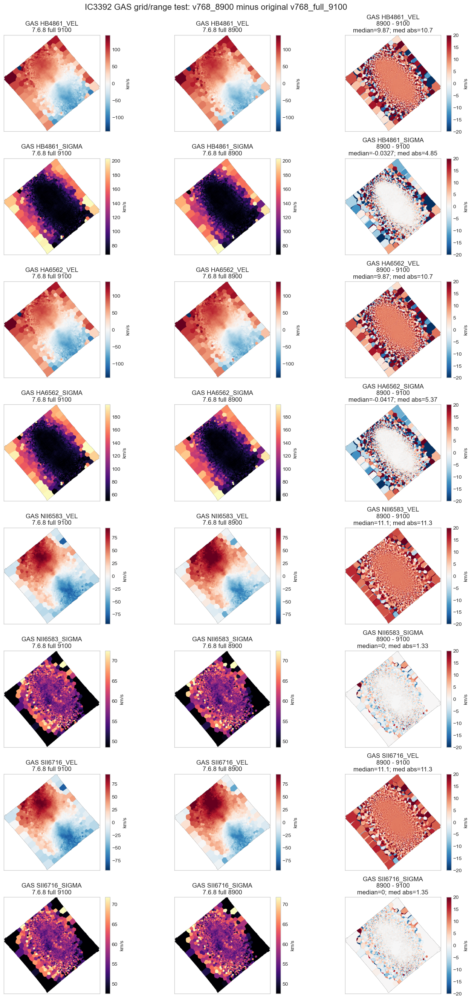

In [5]:
def make_main_kwargs(tracer_key, run_keys):
    spec = TRACERS[tracer_key]
    values = finite_values([maps[tracer_key][run_key] for run_key in run_keys])
    kwargs = {'origin': 'lower', 'cmap': spec['cmap']}
    if spec['center_main']:
        limit = robust_symmetric_limit(values, percentile=98, fallback=1.0)
        kwargs['norm'] = TwoSlopeNorm(vmin=-limit, vcenter=0.0, vmax=limit)
    else:
        vmin, vmax = robust_limits(values)
        kwargs['vmin'] = vmin
        kwargs['vmax'] = vmax
    return kwargs


def plot_focused_8900_vs_9100(tracer_keys=TRACER_ORDER):
    pair = PAIR_BY_KEY['grid_range_test']
    baseline = pair['baseline']
    compare = pair['compare']
    diff_norm = TwoSlopeNorm(vmin=-DIFF_LIMIT, vcenter=0.0, vmax=DIFF_LIMIT)

    fig, axes = plt.subplots(
        len(tracer_keys),
        3,
        figsize=(13.5, 3.3 * len(tracer_keys)),
        squeeze=False,
        constrained_layout=True,
    )
    fig.suptitle('IC3392 GAS grid/range test: v768_8900 minus original v768_full_9100', fontsize=16)

    for row, tracer_key in enumerate(tracer_keys):
        spec = TRACERS[tracer_key]
        main_kwargs = make_main_kwargs(tracer_key, [baseline, compare])
        diff = maps[tracer_key][compare] - maps[tracer_key][baseline]
        vals = diff[np.isfinite(diff)]
        median_delta = np.nanmedian(vals) if vals.size else np.nan
        med_abs = np.nanmedian(np.abs(vals)) if vals.size else np.nan

        panels = [
            (RUNS[baseline]['plot_label'], maps[tracer_key][baseline], main_kwargs),
            (RUNS[compare]['plot_label'], maps[tracer_key][compare], main_kwargs),
            (f"8900 - 9100\nmedian={median_delta:.3g}; med abs={med_abs:.3g}", diff, {'origin': 'lower', 'cmap': 'RdBu_r', 'norm': diff_norm}),
        ]
        for col, (title, arr, kwargs) in enumerate(panels):
            ax = axes[row, col]
            im = ax.imshow(arr, **kwargs)
            ax.set_title(f'{spec["label"]}\n{title}')
            ax.set_xticks([])
            ax.set_yticks([])
            cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
            cbar.set_label('km/s')

    plt.show()


plot_focused_8900_vs_9100()


## Five-run map grids

These grids show all five absolute maps, followed by the key residual maps. The first residual is always the focused `8900 - 9100` test.

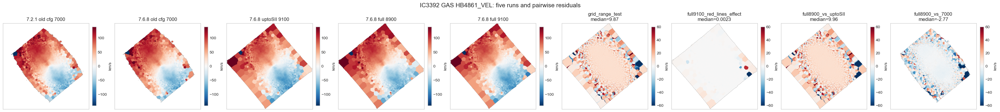

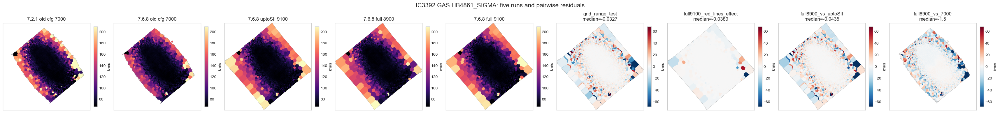

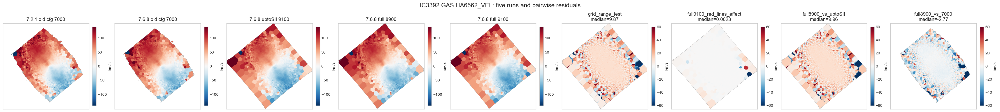

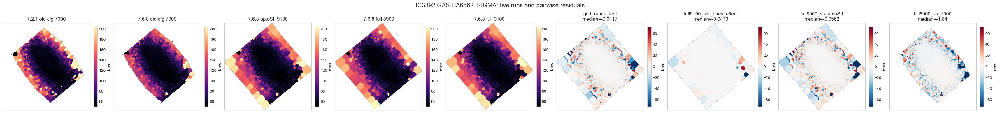

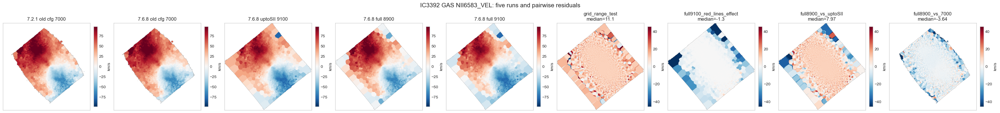

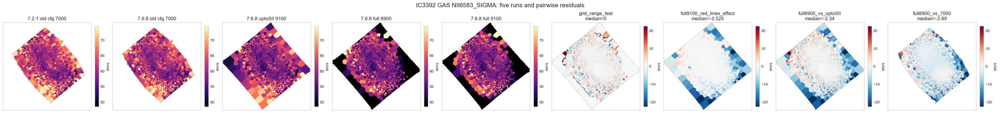

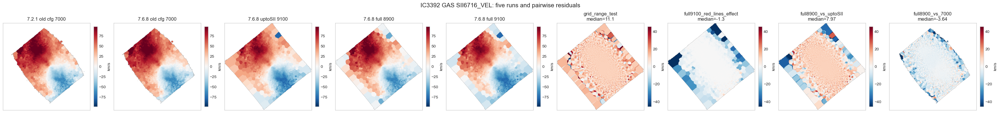

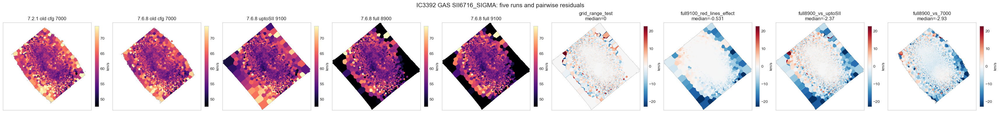

In [6]:
def plot_five_run_and_delta_grid(tracer_key, pair_keys=MAP_PAIR_KEYS):
    spec = TRACERS[tracer_key]
    main_kwargs = make_main_kwargs(tracer_key, RUN_ORDER)
    deltas = [maps[tracer_key][PAIR_BY_KEY[key]['compare']] - maps[tracer_key][PAIR_BY_KEY[key]['baseline']] for key in pair_keys]
    diff_lim = robust_symmetric_limit(finite_values(deltas), percentile=98, fallback=1.0)
    diff_norm = TwoSlopeNorm(vmin=-diff_lim, vcenter=0.0, vmax=diff_lim)

    ncols = len(RUN_ORDER) + len(pair_keys)
    fig, axes = plt.subplots(1, ncols, figsize=(3.8 * ncols, 4.1), constrained_layout=True)
    fig.suptitle(f'IC3392 {spec["label"]}: five runs and pairwise residuals', fontsize=15)

    for col, run_key in enumerate(RUN_ORDER):
        ax = axes[col]
        im = ax.imshow(maps[tracer_key][run_key], **main_kwargs)
        ax.set_title(RUNS[run_key]['plot_label'])
        ax.set_xticks([])
        ax.set_yticks([])
        cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        cbar.set_label('km/s')

    for offset, pair_key in enumerate(pair_keys):
        pair = PAIR_BY_KEY[pair_key]
        residual = maps[tracer_key][pair['compare']] - maps[tracer_key][pair['baseline']]
        vals = residual[np.isfinite(residual)]
        median_delta = np.nanmedian(vals) if vals.size else np.nan
        ax = axes[len(RUN_ORDER) + offset]
        im = ax.imshow(residual, origin='lower', cmap='RdBu_r', norm=diff_norm)
        ax.set_title(f"{pair_key}\nmedian={median_delta:.3g}")
        ax.set_xticks([])
        ax.set_yticks([])
        cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        cbar.set_label('km/s')

    plt.show()


for tracer_key in TRACER_ORDER:
    plot_five_run_and_delta_grid(tracer_key)


## Scatter and residual diagnostics for the focused test

These are the pixel-by-pixel 8900-versus-9100 comparisons. The red dashed line is 1:1. The right panel shows `8900 - 9100` as a function of the original 9100-run value.

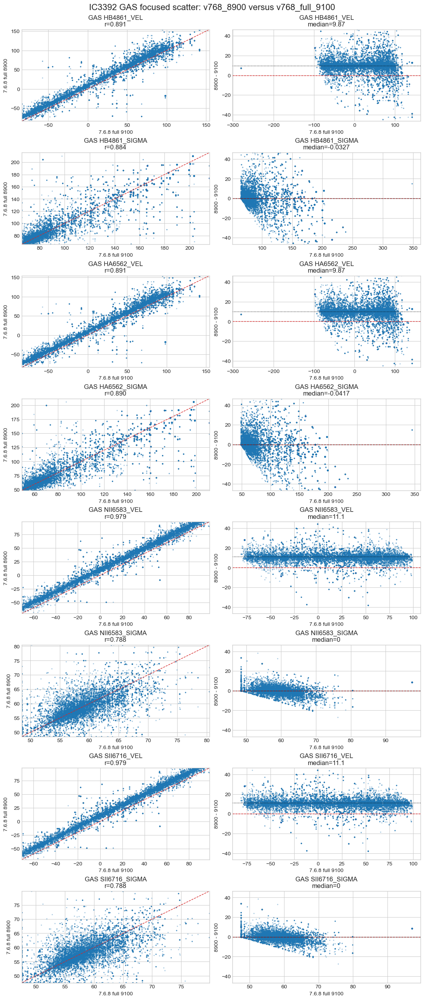

In [7]:
def plot_focused_scatter_residuals(tracer_keys=TRACER_ORDER, max_points=30000, random_state=9):
    rng = np.random.default_rng(random_state)
    pair = PAIR_BY_KEY['grid_range_test']
    baseline_run = pair['baseline']
    compare_run = pair['compare']

    fig, axes = plt.subplots(
        len(tracer_keys),
        2,
        figsize=(10.8, 3.2 * len(tracer_keys)),
        squeeze=False,
        constrained_layout=True,
    )
    fig.suptitle('IC3392 GAS focused scatter: v768_8900 versus v768_full_9100', fontsize=16)

    all_residuals = [maps[tracer_key][compare_run] - maps[tracer_key][baseline_run] for tracer_key in tracer_keys]
    dlim = robust_symmetric_limit(finite_values(all_residuals), percentile=98, fallback=1.0)

    for row, tracer_key in enumerate(tracer_keys):
        spec = TRACERS[tracer_key]
        baseline = maps[tracer_key][baseline_run]
        compare = maps[tracer_key][compare_run]
        mask = np.isfinite(baseline) & np.isfinite(compare)
        baseline_vals = baseline[mask]
        compare_vals = compare[mask]
        delta = compare_vals - baseline_vals

        scatter_ax = axes[row, 0]
        residual_ax = axes[row, 1]
        if baseline_vals.size == 0:
            scatter_ax.set_title(f'{spec["label"]}: no valid overlap')
            residual_ax.set_title(f'{spec["label"]}: no valid overlap')
            continue

        if baseline_vals.size > max_points:
            idx = rng.choice(baseline_vals.size, size=max_points, replace=False)
            plot_baseline = baseline_vals[idx]
            plot_compare = compare_vals[idx]
            plot_delta = delta[idx]
        else:
            plot_baseline = baseline_vals
            plot_compare = compare_vals
            plot_delta = delta

        lim_lo, lim_hi = robust_limits(np.r_[baseline_vals, compare_vals], p=(1, 99))
        median_delta = np.nanmedian(delta)
        pearson_r = np.corrcoef(baseline_vals, compare_vals)[0, 1] if baseline_vals.size > 1 and np.nanstd(baseline_vals) > 0 and np.nanstd(compare_vals) > 0 else np.nan

        scatter_ax.scatter(plot_baseline, plot_compare, s=2, alpha=0.25)
        scatter_ax.plot([lim_lo, lim_hi], [lim_lo, lim_hi], color='tab:red', linestyle='--', linewidth=1)
        scatter_ax.set_xlim(lim_lo, lim_hi)
        scatter_ax.set_ylim(lim_lo, lim_hi)
        scatter_ax.set_xlabel(RUNS[baseline_run]['plot_label'])
        scatter_ax.set_ylabel(RUNS[compare_run]['plot_label'])
        scatter_ax.set_title(f'{spec["label"]}\nr={pearson_r:.3f}')

        residual_ax.scatter(plot_baseline, plot_delta, s=2, alpha=0.25)
        residual_ax.axhline(0.0, color='tab:red', linestyle='--', linewidth=1)
        residual_ax.axhline(median_delta, color='black', linestyle=':', linewidth=1)
        residual_ax.set_ylim(-dlim, dlim)
        residual_ax.set_xlabel(RUNS[baseline_run]['plot_label'])
        residual_ax.set_ylabel('8900 - 9100')
        residual_ax.set_title(f'{spec["label"]}\nmedian={median_delta:.3g}')

    plt.show()


plot_focused_scatter_residuals()


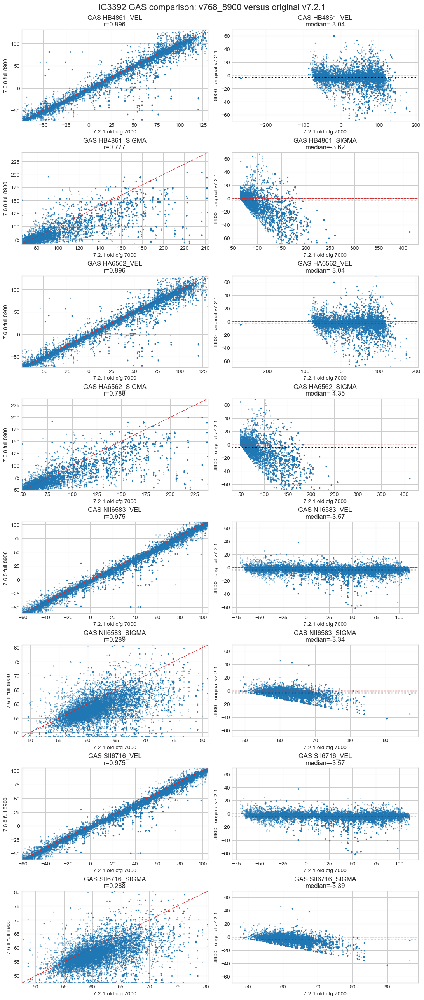

In [8]:
def plot_8900_vs_v721_scatter_residuals(tracer_keys=TRACER_ORDER, max_points=30000, random_state=10):
    rng = np.random.default_rng(random_state)
    baseline_run = 'old_v721_7000'
    compare_run = 'v768_8900'

    fig, axes = plt.subplots(
        len(tracer_keys),
        2,
        figsize=(10.8, 3.2 * len(tracer_keys)),
        squeeze=False,
        constrained_layout=True,
    )
    fig.suptitle('IC3392 GAS comparison: v768_8900 versus original v7.2.1', fontsize=16)

    all_residuals = [maps[tracer_key][compare_run] - maps[tracer_key][baseline_run] for tracer_key in tracer_keys]
    dlim = robust_symmetric_limit(finite_values(all_residuals), percentile=98, fallback=1.0)

    for row, tracer_key in enumerate(tracer_keys):
        spec = TRACERS[tracer_key]
        baseline = maps[tracer_key][baseline_run]
        compare = maps[tracer_key][compare_run]
        mask = np.isfinite(baseline) & np.isfinite(compare)
        baseline_vals = baseline[mask]
        compare_vals = compare[mask]
        delta = compare_vals - baseline_vals

        scatter_ax = axes[row, 0]
        residual_ax = axes[row, 1]
        if baseline_vals.size == 0:
            scatter_ax.set_title(f'{spec["label"]}: no valid overlap')
            residual_ax.set_title(f'{spec["label"]}: no valid overlap')
            continue

        if baseline_vals.size > max_points:
            idx = rng.choice(baseline_vals.size, size=max_points, replace=False)
            plot_baseline = baseline_vals[idx]
            plot_compare = compare_vals[idx]
            plot_delta = delta[idx]
        else:
            plot_baseline = baseline_vals
            plot_compare = compare_vals
            plot_delta = delta

        lim_lo, lim_hi = robust_limits(np.r_[baseline_vals, compare_vals], p=(1, 99))
        median_delta = np.nanmedian(delta)
        pearson_r = np.corrcoef(baseline_vals, compare_vals)[0, 1] if baseline_vals.size > 1 and np.nanstd(baseline_vals) > 0 and np.nanstd(compare_vals) > 0 else np.nan

        scatter_ax.scatter(plot_baseline, plot_compare, s=2, alpha=0.25)
        scatter_ax.plot([lim_lo, lim_hi], [lim_lo, lim_hi], color='tab:red', linestyle='--', linewidth=1)
        scatter_ax.set_xlim(lim_lo, lim_hi)
        scatter_ax.set_ylim(lim_lo, lim_hi)
        scatter_ax.set_xlabel(RUNS[baseline_run]['plot_label'])
        scatter_ax.set_ylabel(RUNS[compare_run]['plot_label'])
        scatter_ax.set_title(f'{spec["label"]}\nr={pearson_r:.3f}')

        residual_ax.scatter(plot_baseline, plot_delta, s=2, alpha=0.25)
        residual_ax.axhline(0.0, color='tab:red', linestyle='--', linewidth=1)
        residual_ax.axhline(median_delta, color='black', linestyle=':', linewidth=1)
        residual_ax.set_ylim(-dlim, dlim)
        residual_ax.set_xlabel(RUNS[baseline_run]['plot_label'])
        residual_ax.set_ylabel('8900 - original v7.2.1')
        residual_ax.set_title(f'{spec["label"]}\nmedian={median_delta:.3g}')

    plt.show()


plot_8900_vs_v721_scatter_residuals()


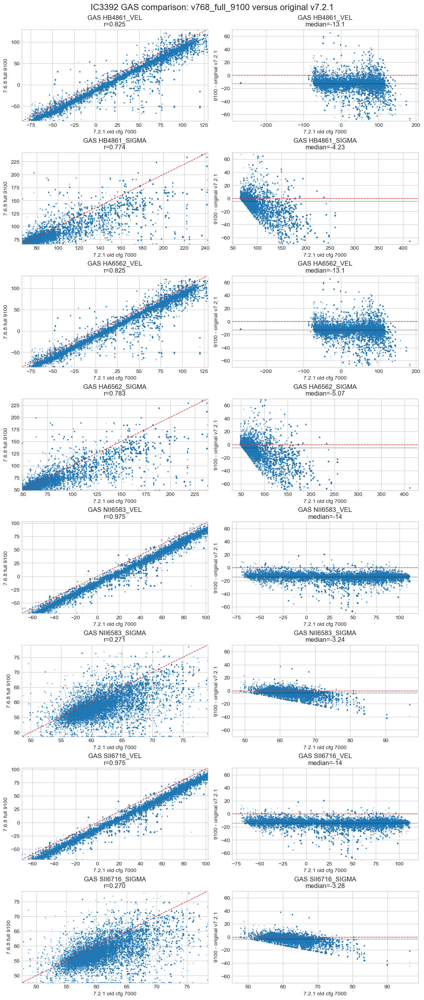

In [9]:
def plot_9100_vs_v721_scatter_residuals(tracer_keys=TRACER_ORDER, max_points=30000, random_state=11):
    rng = np.random.default_rng(random_state)
    baseline_run = 'old_v721_7000'
    compare_run = 'v768_full_9100'

    fig, axes = plt.subplots(
        len(tracer_keys),
        2,
        figsize=(10.8, 3.2 * len(tracer_keys)),
        squeeze=False,
        constrained_layout=True,
    )
    fig.suptitle('IC3392 GAS comparison: v768_full_9100 versus original v7.2.1', fontsize=16)

    all_residuals = [maps[tracer_key][compare_run] - maps[tracer_key][baseline_run] for tracer_key in tracer_keys]
    dlim = robust_symmetric_limit(finite_values(all_residuals), percentile=98, fallback=1.0)

    for row, tracer_key in enumerate(tracer_keys):
        spec = TRACERS[tracer_key]
        baseline = maps[tracer_key][baseline_run]
        compare = maps[tracer_key][compare_run]
        mask = np.isfinite(baseline) & np.isfinite(compare)
        baseline_vals = baseline[mask]
        compare_vals = compare[mask]
        delta = compare_vals - baseline_vals

        scatter_ax = axes[row, 0]
        residual_ax = axes[row, 1]
        if baseline_vals.size == 0:
            scatter_ax.set_title(f'{spec["label"]}: no valid overlap')
            residual_ax.set_title(f'{spec["label"]}: no valid overlap')
            continue

        if baseline_vals.size > max_points:
            idx = rng.choice(baseline_vals.size, size=max_points, replace=False)
            plot_baseline = baseline_vals[idx]
            plot_compare = compare_vals[idx]
            plot_delta = delta[idx]
        else:
            plot_baseline = baseline_vals
            plot_compare = compare_vals
            plot_delta = delta

        lim_lo, lim_hi = robust_limits(np.r_[baseline_vals, compare_vals], p=(1, 99))
        median_delta = np.nanmedian(delta)
        pearson_r = np.corrcoef(baseline_vals, compare_vals)[0, 1] if baseline_vals.size > 1 and np.nanstd(baseline_vals) > 0 and np.nanstd(compare_vals) > 0 else np.nan

        scatter_ax.scatter(plot_baseline, plot_compare, s=2, alpha=0.25)
        scatter_ax.plot([lim_lo, lim_hi], [lim_lo, lim_hi], color='tab:red', linestyle='--', linewidth=1)
        scatter_ax.set_xlim(lim_lo, lim_hi)
        scatter_ax.set_ylim(lim_lo, lim_hi)
        scatter_ax.set_xlabel(RUNS[baseline_run]['plot_label'])
        scatter_ax.set_ylabel(RUNS[compare_run]['plot_label'])
        scatter_ax.set_title(f'{spec["label"]}\nr={pearson_r:.3f}')

        residual_ax.scatter(plot_baseline, plot_delta, s=2, alpha=0.25)
        residual_ax.axhline(0.0, color='tab:red', linestyle='--', linewidth=1)
        residual_ax.axhline(median_delta, color='black', linestyle=':', linewidth=1)
        residual_ax.set_ylim(-dlim, dlim)
        residual_ax.set_xlabel(RUNS[baseline_run]['plot_label'])
        residual_ax.set_ylabel('9100 - original v7.2.1')
        residual_ax.set_title(f'{spec["label"]}\nmedian={median_delta:.3g}')

    plt.show()


plot_9100_vs_v721_scatter_residuals()


## Observation: wavelength-grid sensitivity in GAS velocity

The five-run comparison supports the suspicion that the GAS kinematic solution is sensitive to the log-rebinned wavelength grid / fitting range.

Relative to the `v768_7000` run, the original full `4800-9100 A` run gives a coherent negative GAS velocity offset: about `-12.86 km/s` for `HB4861`/`HA6562` and about `-14.07 km/s` for `NII6583`/`SII6716`. When the otherwise standard full-red-line setup is changed to `4800-8900 A`, the offset relative to `v768_7000` drops to only about `-2.77 km/s` for `HB4861`/`HA6562` and `-3.64 km/s` for `NII6583`/`SII6716`.

The key isolation test is `v768_8900 - v768_full_9100`: even with the same standard setup, same full emission-line file, and `VELSCALE = 41`, changing only the wavelength end from `9100 A` to `8900 A` shifts the GAS velocity maps by about `+9.87 km/s` for `HB4861`/`HA6562` and `+11.15 km/s` for `NII6583`/`SII6716`.

Conclusion: this strongly supports the grid/range hypothesis. The large GAS velocity offset is not just an astrophysical or stellar-continuum population effect; it can be introduced by the wavelength range/log-rebin grid used by the GAS fit. Since emission lines are narrow features sampled on that grid, small changes in the rebinned wavelength solution can propagate into coherent velocity offsets, especially when lines are tied. This is strong evidence rather than an absolute proof, but it is enough to treat the GAS velocities from different wavelength-grid setups as not directly interchangeable without an explicit cross-run calibration.

## Focused interpretation helper

This table is just a compact triage of the focused 8900-minus-9100 comparison. Use it with the maps and scatter plots above.

In [10]:
def classify_grid_test_row(row):
    if row['n_valid'] == 0:
        return 'no overlap'
    if row['median_abs_delta'] < 0.5 and row['rms_delta'] < 3:
        return 'mostly stable'
    if row['median_abs_delta'] < 2 and row['rms_delta'] < 8:
        return 'small median but local differences'
    if row['median_abs_delta'] < 5:
        return 'moderate grid/range sensitivity'
    return 'strong grid/range sensitivity'

focused_interpretation = focused_grid_test.copy()
focused_interpretation['focused_read'] = focused_interpretation.apply(classify_grid_test_row, axis=1)
focused_interpretation = focused_interpretation[
    [
        'tracer', 'line', 'gas_quantity', 'focused_read', 'pearson_r',
        'median_delta_compare_minus_baseline', 'median_abs_delta', 'p16_delta', 'p84_delta', 'rms_delta',
        'median_abs_pct_change'
    ]
]
display(focused_interpretation)

print('Focused grid/range test summary: v768_8900 - v768_full_9100')
for _, row in focused_interpretation.iterrows():
    print(
        f"  {row['tracer']}: {row['focused_read']}; "
        f"median={row['median_delta_compare_minus_baseline']:.3g}, "
        f"median_abs={row['median_abs_delta']:.3g}, rms={row['rms_delta']:.3g}, "
        f"p16/p84={row['p16_delta']:.3g}/{row['p84_delta']:.3g}"
    )


,tracer,line,gas_quantity,focused_read,pearson_r,median_delta_compare_minus_baseline,median_abs_delta,p16_delta,p84_delta,rms_delta,median_abs_pct_change
0,GAS_HB4861_VEL,HB4861,VEL,strong grid/range sensitivity,0.891484,9.868029,10.659447,0.762308,18.167149,29.038520,20.132812
1,GAS_HB4861_SIGMA,HB4861,SIGMA,moderate grid/range sensitivity,0.884273,-0.032739,4.852951,-9.844670,7.419843,22.258635,3.866631
2,GAS_HA6562_VEL,HA6562,VEL,strong grid/range sensitivity,0.891484,9.868029,10.659447,0.762308,18.167149,29.038520,20.132812
3,GAS_HA6562_SIGMA,HA6562,SIGMA,strong grid/range sensitivity,0.889748,-0.041666,5.374206,-11.234635,8.019317,23.573854,4.683382
4,GAS_NII6583_VEL,NII6583,VEL,strong grid/range sensitivity,0.979100,11.149691,11.253970,6.291286,15.433380,13.926749,36.318896
5,GAS_NII6583_SIGMA,NII6583,SIGMA,small median but local differences,0.787729,0.000000,1.328028,-2.689446,2.712851,4.950741,2.303603
6,GAS_SII6716_VEL,SII6716,VEL,strong grid/range sensitivity,0.979100,11.149691,11.253970,6.291286,15.433380,13.926749,36.318896
7,GAS_SII6716_SIGMA,SII6716,SIGMA,small median but local differences,0.787965,0.000000,1.349564,-2.723074,2.764665,5.010713,2.367608


Focused grid/range test summary: v768_8900 - v768_full_9100
  GAS_HB4861_VEL: strong grid/range sensitivity; median=9.87, median_abs=10.7, rms=29, p16/p84=0.762/18.2
  GAS_HB4861_SIGMA: moderate grid/range sensitivity; median=-0.0327, median_abs=4.85, rms=22.3, p16/p84=-9.84/7.42
  GAS_HA6562_VEL: strong grid/range sensitivity; median=9.87, median_abs=10.7, rms=29, p16/p84=0.762/18.2
  GAS_HA6562_SIGMA: strong grid/range sensitivity; median=-0.0417, median_abs=5.37, rms=23.6, p16/p84=-11.2/8.02
  GAS_NII6583_VEL: strong grid/range sensitivity; median=11.1, median_abs=11.3, rms=13.9, p16/p84=6.29/15.4
  GAS_NII6583_SIGMA: small median but local differences; median=0, median_abs=1.33, rms=4.95, p16/p84=-2.69/2.71
  GAS_SII6716_VEL: strong grid/range sensitivity; median=11.1, median_abs=11.3, rms=13.9, p16/p84=6.29/15.4
  GAS_SII6716_SIGMA: small median but local differences; median=0, median_abs=1.35, rms=5.01, p16/p84=-2.72/2.76


## Optional save

Uncomment these lines if you want CSV summaries for notes or a report.

In [11]:
# summary.to_csv('IC3392_GAS_kin_5runs_pairwise_summary_stats.csv', index=False)
# focused_grid_test.to_csv('IC3392_GAS_kin_5runs_8900_minus_9100_focus.csv', index=False)
# focused_interpretation.to_csv('IC3392_GAS_kin_5runs_8900_minus_9100_interpretation.csv', index=False)
# config_deltas.to_csv('IC3392_GAS_kin_5runs_config_deltas.csv', index=False)
# print('Saved IC3392 five-run GAS kinematic comparison CSV files.')
